[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://bit.ly/open-data-03-franchise-input)

## 소상공인시장진흥공단 상가업소정보로 프랜차이즈 입점분석

* 배스킨라빈스와 던킨도너츠는 근처에 입지한 것을 종종 볼 수 있었어요.
* 또, 파리바게뜨와 뚜레주르는 주변에서 많이 볼 수 있는 프랜차이즈 중 하나에요. 
* 이런 프랜차이즈 매장이 얼마나 모여 있는지 혹은 흩어져 있는지 지도에 직접 표시를 해보면서 대용량 데이터에서 원하는 특정 데이터를 추출해 보는 실습을 해봅니다.
* 추출한 데이터를 전처리하고 가공해서 원하는 형태로 시각화를 하거나 지도에 표현합니다.
* Python, Pandas, Numpy, Seaborn, Matplotlib, folium 을 통해 다양한 방법으로 표현하면서 파이썬의 여러 도구들에 익숙해 지는 것을 목표로 합니다.

### 다루는 내용
* 데이터 요약하기
* 공공데이터를 활용해 텍스트 데이터 정제하고 원하는 정보 찾아내기
* 문자열에서 원하는 텍스트 추출하기
* 문자열을 활용한 다양한 분석 방법과 위치 정보 사용하기
* folium을 통한 위경도 데이터 시각화 이해하기
* folium을 통해 지도에 분석한 내용을 표현하기 - CircleMarker와 MarkerCluster 그리기


### 데이터셋
* 공공데이터 포털 : https://www.data.go.kr/dataset/15012005/fileData.do
* 영상에 사용한 데이터셋 : http://bit.ly/open-data-set-folder (공공데이터포털에서 다운로드 받은 파일이 있습니다. 어떤 파일을 다운로드 받아야 될지 모르겠다면 여기에 있는 파일을 사용해 주세요.)

## 필요한 라이브러리 불러오기

In [1]:
# pandas, numpy, seaborn을 불러옵니다.
import pandas as pd # 분석용
import numpy as np # 수치계산용 라이브러리
import seaborn as sns # 시각화
import matplotlib.pyplot as plt # 한글폰트 설정 및 그래프 사이즈 조정
# 구버전의 주피터 노트북에서 그래프가 보이는 설정
%matplotlib inline

## 시각화를 위한 한글 폰트 설정하기

In [2]:
plt.rc("font", family = "Malgun Gothic")
plt.rc("axes", unicode_minus = False)

In [8]:
# 폰트가 선명하게 보이도록 설정
from IPython.display import set_matplotlib_formats
set_matplotlib_formats("retina")

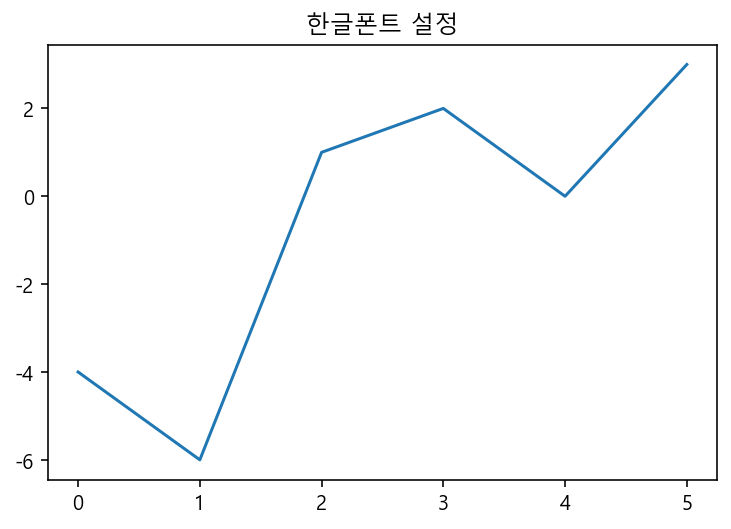

In [9]:
# 한글폰트와 마이너스 폰트 설정 확인
plt.title("한글폰트 설정")
plt.plot([-4, -6, 1, 2, 0, 3])

## Google Colab 을 위한 코드
### Colab 에서 실행을 위한 코드

* 아래의 코드는 google colaboratory 에서 실행을 위한 코드로 로컬 아나콘다에서는 주석처리합니다.
* google colaboratory 에서는 주석을 풀고 폰트 설정과 csv 파일을 불러옵니다.

In [ ]:
# # 나눔고딕 설치
# !apt -qq -y install fonts-nanum > /dev/null

# import matplotlib.font_manager as fm

# fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
# font = fm.FontProperties(fname=fontpath, size=9)
# fm._rebuild()

# # 그래프에 retina display 적용
# %config InlineBackend.figure_format = 'retina'

# # Colab 의 한글 폰트 설정
# plt.rc('font', family='NanumBarunGothic') 

### Colab 용 GoogleAuth 인증 
* 구글 드라이브에 있는 파일을 가져오기 위해 사용합니다.

In [ ]:
# # 구글 드라이브에서 csv 파일을 읽어오기 위해 gauth 인증
# !pip install -U -q PyDrive
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials

# # PyDrive client 인증
# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)

In [ ]:
# # 공유 가능한 링크로 파일 가져오기
# url = 'https://drive.google.com/open?id=1e91PH_KRFxNXUsx8Hi-Q2vPiorCDsOP4'
# id = url.split('=')[1]
# print(id)
# downloaded = drive.CreateFile({'id':id}) 
# # data 폴더에 파일을 관리하며, 폴더가 없다면 만들어서 파일을 관리하도록 한다.
# %mkdir data
# downloaded.GetContentFile('data/상가업소정보_201912_01.csv')  

## 데이터 불러오기
* 공공데이터 포털 : https://www.data.go.kr/dataset/15012005/fileData.do
* 공공데이터 포털에서 소상공인시장진흥공단 상가업소정보를 다운로드 받아 사용했습니다
* 영상에 사용한 데이터셋 : http://bit.ly/open-data-set-folder (공공데이터포털에서 다운로드 받은 파일이 있습니다. 어떤 파일을 다운로드 받아야 될지 모르겠다면 여기에 있는 파일을 사용해 주세요.)

In [10]:
%ls data

 C 드라이브의 볼륨에는 이름이 없습니다.
 볼륨 일련 번호: 9A9A-519D

 C:\Users\jinseul\open-data-analysis-basic\data 디렉터리

2021-01-19  오후 10:12    <DIR>          .
2021-01-19  오후 10:12    <DIR>          ..
2021-01-19  오후 09:54       264,920,940 상가업소정보_201912_01.csv
2021-01-16  오후 09:13             2,163 전국 평균 분양가격(2013년 9월부터 2015년 8월까지).csv
2021-01-16  오후 09:13           162,510 주택도시보증공사_전국 평균 분양가격(2019년 12월).csv
               3개 파일         265,085,613 바이트
               2개 디렉터리  37,424,345,088 바이트 남음


In [3]:
# 파일을 불러와 df 라는 변수에 담습니다.
df = pd.read_csv("data/상가업소정보_201912_01.csv", sep = "|")
df.sample()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
476526,14221295,아이비클럽,성북점,D,소매,D05,의복의류,D05A16,교복판매,G47416,...,1129010500102260000050344,NaN,서울특별시 성북구 동소문로 20,136032,2860.0,NaN,2,NaN,127.008367,37.589201


### 데이터 크기 보기

In [16]:
# shape 를 통해 불러온 csv 파일의 크기를 확인합니다.
df.shape

(573680, 39)

### info 보기

In [17]:
# info 를 사용하면 데이터의 전체적인 정보를 볼 수 있습니다.
# 데이터의 사이즈, 타입, 메모리 사용량 등을 볼 수 있습니다.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 39 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   상가업소번호     573680 non-null  int64  
 1   상호명        573679 non-null  object 
 2   지점명        76674 non-null   object 
 3   상권업종대분류코드  573680 non-null  object 
 4   상권업종대분류명   573680 non-null  object 
 5   상권업종중분류코드  573680 non-null  object 
 6   상권업종중분류명   573680 non-null  object 
 7   상권업종소분류코드  573680 non-null  object 
 8   상권업종소분류명   573680 non-null  object 
 9   표준산업분류코드   539290 non-null  object 
 10  표준산업분류명    539290 non-null  object 
 11  시도코드       573680 non-null  int64  
 12  시도명        573680 non-null  object 
 13  시군구코드      573680 non-null  int64  
 14  시군구명       573680 non-null  object 
 15  행정동코드      573680 non-null  int64  
 16  행정동명       573680 non-null  object 
 17  법정동코드      573680 non-null  int64  
 18  법정동명       573680 non-null  object 
 19  지번코드       573680 non-n

### 결측치 보기

<AxesSubplot:>

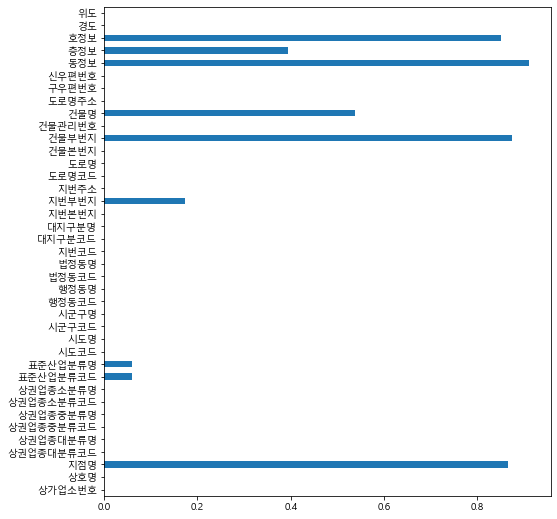

In [5]:
# isnull() 을 사용하면 데이터의 결측치를 볼 수 있습니다.
# 결측치는 True로 값이 있다면 False로 표시되는데 True 는 1과 같기 때문에 
# True 값을 sum()을 사용해서 더하게 되면 합계를 볼 수 있습니다.
# mean()을 사용하면 결측치의 비율을 볼 수 있습니다.
df.isnull().sum()
df.isnull().mean().plot.barh(figsize = (8, 9))

### 사용하지 않는 컬럼 제거하기

In [6]:
# drop을 하는 방법도 있지만 사용할 컬럼만 따로 모아서 보는 방법도 있습니다.
# 여기에서는 사용할 컬럼만 따로 모아서 사용합니다.
columns = ['상호명', '상권업종대분류명', '상권업종중분류명', '상권업종소분류명', 
           '시도명', '시군구명', '행정동명', '법정동명', '도로명주소', 
           '경도', '위도']
df = df[columns].copy()
df
print(df.shape)

(573680, 11)


In [24]:
# 제거 후 메모리 사용량 보기
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   상호명       573679 non-null  object 
 1   상권업종대분류명  573680 non-null  object 
 2   상권업종중분류명  573680 non-null  object 
 3   상권업종소분류명  573680 non-null  object 
 4   시도명       573680 non-null  object 
 5   시군구명      573680 non-null  object 
 6   행정동명      573680 non-null  object 
 7   법정동명      573680 non-null  object 
 8   도로명주소     573680 non-null  object 
 9   경도        573680 non-null  float64
 10  위도        573680 non-null  float64
dtypes: float64(2), object(9)
memory usage: 48.1+ MB


## 색인으로 서브셋 가져오기
### 서울만 따로 보기

In [8]:
# 시도명이 서울로 시작하는 데이터만 봅니다.
# 또, df_seoul 이라는 변수에 결과를 저장합니다.
# 새로운 변수에 데이터프레임을 할당할 때 copy()를 사용하는 것을 권장합니다.
df_seoul = df[df["시도명"].str.contains("^서울")].copy()
df_seoul.head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
4,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
5,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


In [32]:
# unique 를 사용하면 중복을 제거한 시군구명을 가져옵니다. 
# 그리고 shape로 갯수를 출력해 봅니다.
df_seoul["시군구명"].unique()

array(['강남구', '금천구', '송파구', '광진구', '강서구', '중구', '서초구', '성북구', '구로구',
       '영등포구', '서대문구', '동대문구', '노원구', '동작구', '성동구', '관악구', '강동구', '양천구',
       '종로구', '강북구', '은평구', '중랑구', '도봉구', '마포구', '용산구'], dtype=object)

In [33]:
# nunique 를 사용하면 중복을 제거한 시군구명의 갯수를 세어줍니다.
df_seoul["시군구명"].nunique()

25

## 파일로 저장하기
* 전처리한 파일을 저장해 두면 재사용을 할 수 있습니다.
* 재사용을 위해 파일로 저장합니다.

In [34]:
# "seoul_open_store.csv" 라는 이름으로 저장합니다.
df_seoul.to_csv("seoul_open_store.csv", index = False)

In [35]:
# 제대로 저장이 되었는지 같은 파일을 불러와서 확인합니다.
pd.read_csv("seoul_open_store.csv").head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
3,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
4,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


## 배스킨라빈스, 던킨도너츠 위치 분석

### 특정 상호만 가져오기
* 여기에서는 배스킨라빈스와 던킨도너츠 상호를 가져와서 실습합니다.
* 위에서 pandas의 str.conatains를 활용해 봅니다.
* https://pandas.pydata.org/docs/user_guide/text.html#testing-for-strings-that-match-or-contain-a-pattern

* 상호명에서 브랜드명을 추출합니다.
* 대소문자가 섞여 있을 수도 있기 때문에 대소문자를 변환해 줍니다.
* 오타를 방지하기 위해 배스킨라빈스의 영문명은 baskinrobbins, 던킨도너츠는 dunkindonuts 입니다.

In [9]:
# 문자열의 소문자로 변경하는 메소드를 사용합니다.
# "상호명_소문자" 컬럼을 만듭니다.
df_seoul["상호명_소문자"] = df_seoul["상호명"].str.lower()
df_seoul.sample()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
82728,퀸즈,소매,의복의류,일반의류,서울특별시,중구,회현동,남창동,서울특별시 중구 남대문시장4길 21,126.977639,37.559178,퀸즈


In [44]:
# baskinrobbins 를 "상호명_소문자" 컬럼으로 가져옵니다.
# 띄어쓰기 등의 다를 수 있기 때문에 앞글자 baskin 만 따서 가져오도록 합니다.
# '상호명_소문자'컬럼으로 '배스킨라빈스|baskin' 를 가져와 갯수를 세어봅니다.
# loc[행]
# loc[행, 열]
df_seoul.loc[df_seoul["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskin"), "상호명_소문자"]


76             배스킨라빈스
2164           베스킨라빈스
11060     베스킨라빈스은행나무점
13953          배스킨라빈스
14201          베스킨라빈스
             ...     
557464       배스킨라빈스31
557822       배스킨라빈스31
558006       배스킨라빈스31
561929       배스킨라빈스31
561930       배스킨라빈스31
Name: 상호명_소문자, Length: 466, dtype: object

In [10]:
# 상호명에서 던킨도너츠만 가져옵니다.
# 상호명은 소문자로 변경해 준 컬럼을 사용합니다.
# 던킨|dunkin 의 "상호명_소문자"로 갯수를 세어봅니다.

df_seoul.loc[df_seoul["상호명_소문자"].str.contains("던킨|dunkin"), "상호명_소문자"]

1167              던킨도너츠
1819        던킨도너츠테크노마트점
2305         던킨도너츠창동하나로
2342      던킨도너츠용산민자역사2호
3007              던킨도너츠
              ...      
553907            던킨도너츠
554211            던킨도너츠
558894    dunkindoonuts
560984            던킨도너츠
569825            던킨도너츠
Name: 상호명_소문자, Length: 191, dtype: object

In [11]:
# '상호명_소문자'컬럼으로  '배스킨|베스킨|baskin|던킨|dunkin'를 가져와 df_31 변수에 담습니다.

df_31 = df_seoul[df_seoul["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskin|던킨|dunkin")].copy()
df_31.shape

(657, 12)

In [12]:
#상호명을 통일해주기 위해 브랜드명 컬럼을 만든다.
df_31["브랜드명"] = np.nan
df_31.loc[df_31["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskin"), "브랜드명"] = "배스킨라빈스"
# 남은 결측치를 던킨도너츠로 채워준다.
df_31["브랜드명"] = df_31["브랜드명"].fillna("던킨도너츠")
# ~은 not을 의미합니다. 베스킨라빈스가 아닌 데이터를 찾을 때 사용하면 좋습니다. 
# ex) df_31.loc[~df_31["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskin"), "브랜드명"] = "던킨도너츠"
df_31["브랜드명"]

76        배스킨라빈스
1167       던킨도너츠
1819       던킨도너츠
2164      배스킨라빈스
2305       던킨도너츠
           ...  
558894     던킨도너츠
560984     던킨도너츠
561929    배스킨라빈스
561930    배스킨라빈스
569825     던킨도너츠
Name: 브랜드명, Length: 657, dtype: object

In [13]:
# 데이터가 제대로 모아졌는지 확인합니다.
# "상권업종대분류명"을  value_counts 를 통해 빈도수를 계산합니다.
df_31["상권업종대분류명"].value_counts()

#소매와 생활서비스는 잘못 수집된 데이터 같으므로 밑에서 제거해줄 것이다.

음식       655
생활서비스      1
소매         1
Name: 상권업종대분류명, dtype: int64

In [14]:
# "상권업종대분류명"컬럼에서 isin 기능을 사용해서 "소매", "생활서비스" 인 데이터만 가져옵니다.
df_31[df_31["상권업종대분류명"].isin(["소매", "생활서비스"])]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
358699,배스킨라빈스,소매,종합소매점,할인점,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 압구정로 204,127.029381,37.527375,배스킨라빈스,배스킨라빈스
556592,baskinrobbins,생활서비스,광고/인쇄,인쇄종합,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 강남대로 396,127.028289,37.498154,baskinrobbins,배스킨라빈스


In [15]:
# "상권업종대분류명"에서 "소매", "생활서비스"는 제외합니다.
~df_31["상권업종대분류명"].isin(["소매", "생활서비스"]) # ~를 쓰므로써 소매와 생활서비스가 들어있을 경우 False로 출력된다.
df_31 = df_31[~df_31["상권업종대분류명"].isin(["소매", "생활서비스"])].copy()
# 혹은 df_31 = df_31[df_31["상권업종대분류명"] == "음식"]
df_31.shape

(655, 13)

잘못 수집된 데이터 2개가 제거 되었다.

In [16]:
df_31["상권업종대분류명"].value_counts()

음식    655
Name: 상권업종대분류명, dtype: int64

### 범주형 값으로 countplot 그리기

In [25]:
# value_counts 로 "브랜드명"의 빈도수를 구하고 brand_counts에 담아줍니다.
brand_counts = df_31["브랜드명"].value_counts()
brand_counts

배스킨라빈스    464
던킨도너츠     191
Name: 브랜드명, dtype: int64

<AxesSubplot:>

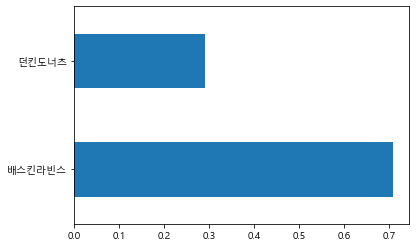

In [20]:
# normalize=True 로 빈도수의 비율을 구합니다.
df_31["브랜드명"].value_counts(normalize = True).plot.barh()

In [21]:
brand_counts.index
brand_counts.index[0]

'배스킨라빈스'

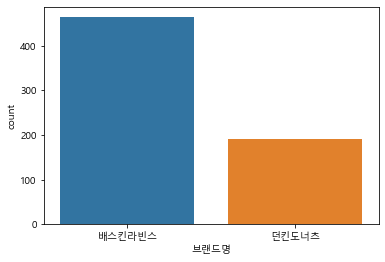

In [22]:
# countplot 을 그립니다.
g = sns.countplot(data = df_31, x = "브랜드명")

In [23]:
print(brand_counts[0], brand_counts[1])

464 191


In [235]:
# enumerate 함수
for i, val in enumerate(brand_counts): # i : 인덱스 번호, val : 해당하는 데이터
    print(i, val)

0 464
1 191


In [26]:
t = [1, 5, 7, 33]
for i, val in enumerate(t):
    print(i, val)

0 1
1 5
2 7
3 33


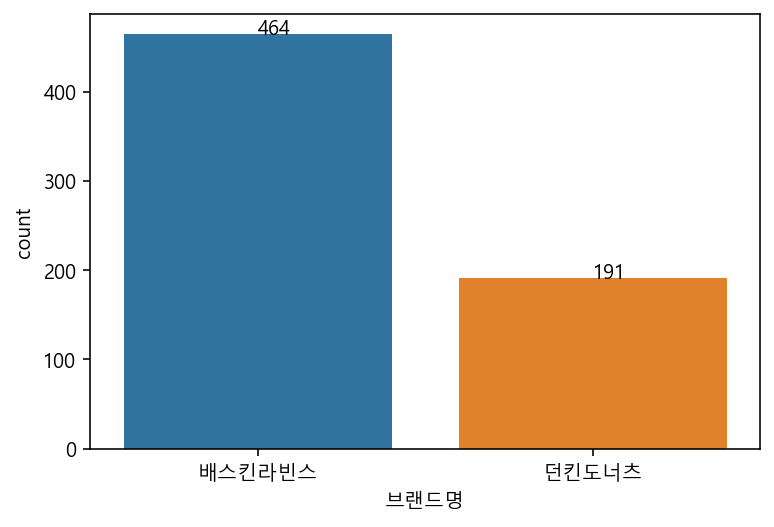

In [236]:
# countplot위에 숫자가 나오도록 그립니다.
g = sns.countplot(data = df_31, x = "브랜드명")
for i, val in enumerate(brand_counts): 
    g.text(x = i, y = val, s = val) # x, y : 위치, s : 어떤 문자를 출력할지


<AxesSubplot:xlabel='시군구명', ylabel='count'>

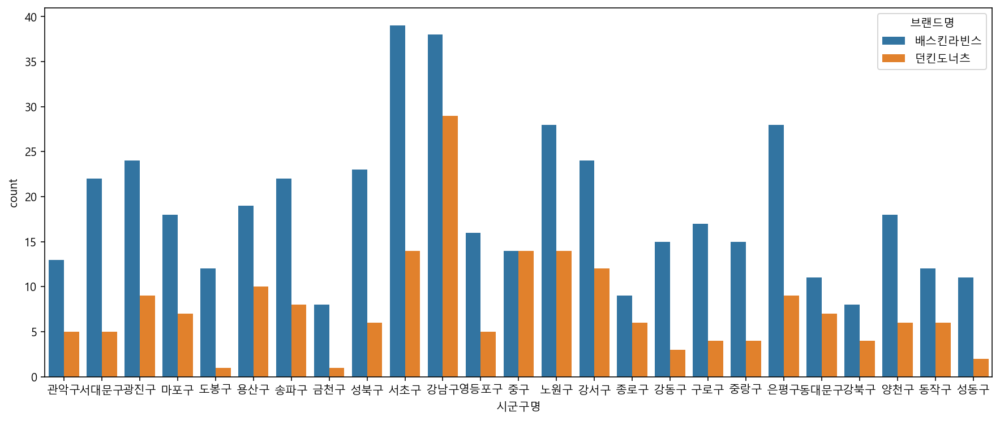

In [98]:
# 시군구명으로 빈도수를 세고 브랜드명으로 색상을 다르게 표현하는 countplot 을 그립니다.
plt.figure(figsize = (15, 6))
sns.countplot(data = df_31, x = "시군구명", hue = "브랜드명")

In [28]:
# 위 그래프에도 숫자를 표시하고 싶다면 그룹화된 연산이 필요합니다.
# value_counts는 Series에만 사용이 가능하기 때문에 위에서 한 것처럼 value_counts는 못 쓰고 groupby 나 pivot_table로 구해볼 수 있습니다.
table_city_brand = df_31.pivot_table(index="시군구명", columns="브랜드명", values="상호명", aggfunc="count")
table_city_brand.head()

브랜드명,던킨도너츠,배스킨라빈스
시군구명,,
강남구,29,38
강동구,3,15
강북구,4,8
강서구,12,24
관악구,5,13


In [121]:
# iterrows : 행을 순회함. 여기서 index값은 시군구명이므로 i에는 시군구명이 들어가있고, val에는 시군구명에 해당하는 행 한 줄이 들어감.
# for 문을 반복하면서 다음 행으로 넘어간다.
for i, val in table_city_brand.head().iterrows():
    print(i,val)

강남구 브랜드명
던킨도너츠     29
배스킨라빈스    38
Name: 강남구, dtype: int64
강동구 브랜드명
던킨도너츠      3
배스킨라빈스    15
Name: 강동구, dtype: int64
강북구 브랜드명
던킨도너츠     4
배스킨라빈스    8
Name: 강북구, dtype: int64
강서구 브랜드명
던킨도너츠     12
배스킨라빈스    24
Name: 강서구, dtype: int64
관악구 브랜드명
던킨도너츠      5
배스킨라빈스    13
Name: 관악구, dtype: int64


In [116]:
# iterrows : 행을 순회함.
for i, val in table_city_brand.iterrows():
    dunkin = val["던킨도너츠"] # 여기서 val은 인덱스i에 해당하는 행 한 줄임. 그곳에 "던킨도너츠"열에 해당하는 값을 뽑아옴.
    baskin = val["배스킨라빈스"]
    print(dunkin, baskin)

29 38
3 15
4 8
12 24
5 13
9 24
4 17
1 8
14 28
1 12
7 11
6 12
7 18
5 22
14 39
2 11
6 23
8 22
6 18
5 16
10 19
9 28
6 9
14 14
4 15


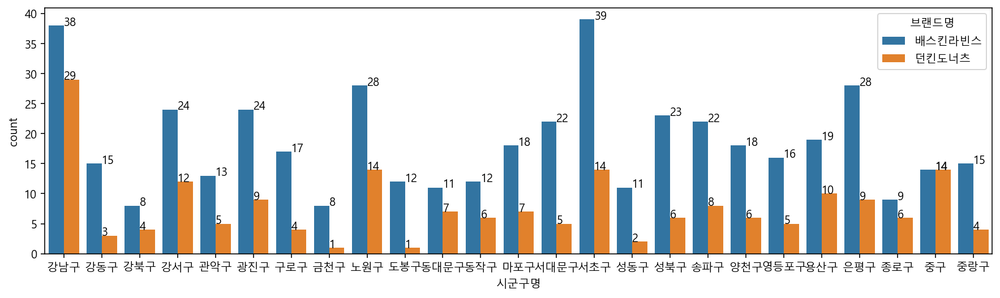

In [124]:
plt.figure(figsize=(15, 4))
# 위에서 만든 피봇테이블과 "시군구명"의 순서과 같게 표시되게 하기 위해 order 값을 지정합니다.
g = sns.countplot(data=df_31, x="시군구명", hue="브랜드명", order=table_city_brand.index)
# 여기에서 i 값은 시군구명 즉 문자이므로 위치를 표현하기 위해 숫자로 표현해줄 필요가 있습니다.
# 그래서 순서대로 0번부터 찍어줄 수 있도록 index_no 를 만들어 주고 for문을 순회할 때마다 하나씩 증가시킵니다.
index_no = 0
for i, val in table_city_brand.iterrows():
    dunkin = val["던킨도너츠"]
    baskin = val["배스킨라빈스"]
    g.text(x=index_no, y=dunkin, s=dunkin)
    g.text(x=index_no, y=baskin, s=baskin)
    index_no += 1

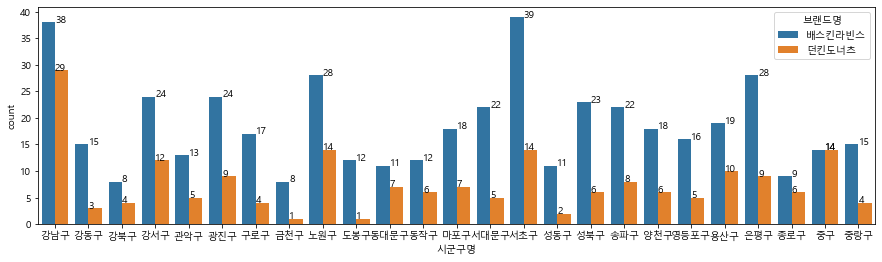

In [30]:
# iterrows 안쓰고 다른방법
plt.figure(figsize=(15, 4))
# 위에서 만든 피봇테이블과 "시군구명"의 순서과 같게 표시되게 하기 위해 order 값을 지정합니다.
g = sns.countplot(data=df_31, x="시군구명", hue="브랜드명", order=table_city_brand.index)

numb = 0
for i in table_city_brand.index:
    dunkin = table_city_brand.loc[i, "던킨도너츠"]
    baskin = table_city_brand.loc[i, "배스킨라빈스"]
    
    g.text(x = numb, y = dunkin, s = dunkin)    
    g.text(x = numb, y = baskin, s = baskin)
    
    numb += 1

### scatterplot 그리기

* https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#scatter-plot

<AxesSubplot:xlabel='경도', ylabel='위도'>

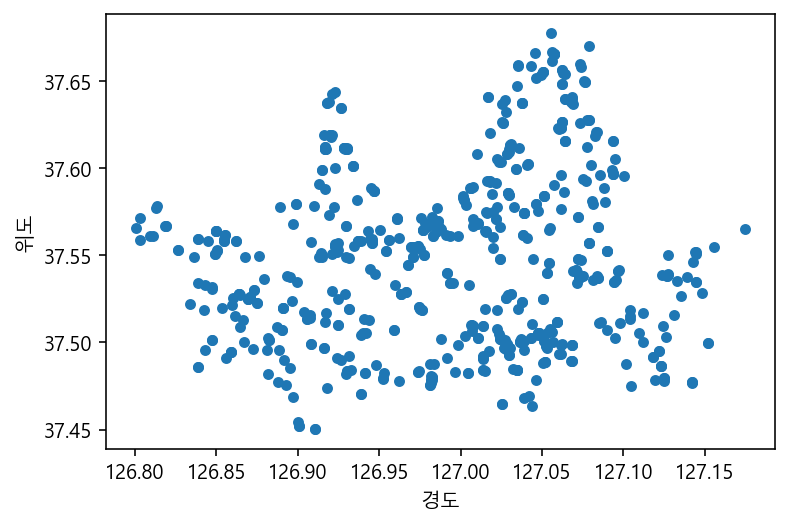

In [132]:
# Pandas 의 plot으로 경도와 위도 scatterplot 을 그립니다.
df_31[["위도", "경도"]].plot.scatter(x = "경도", y = "위도")

<AxesSubplot:xlabel='경도', ylabel='위도'>

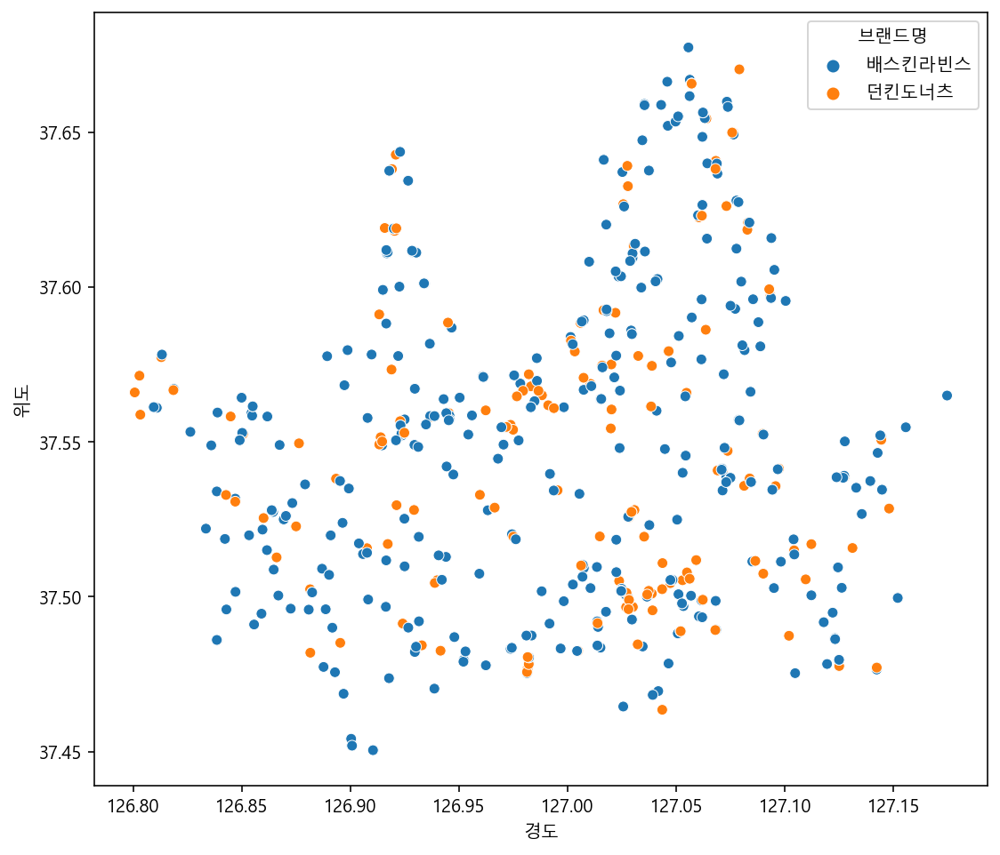

In [135]:
# seaborn의 scatterplot 으로 hue에 브랜드명을 지정해서 시각화 합니다.
plt.figure(figsize = (9, 8))
sns.scatterplot(data = df_31, x = "경도", y = "위도", hue = "브랜드명")

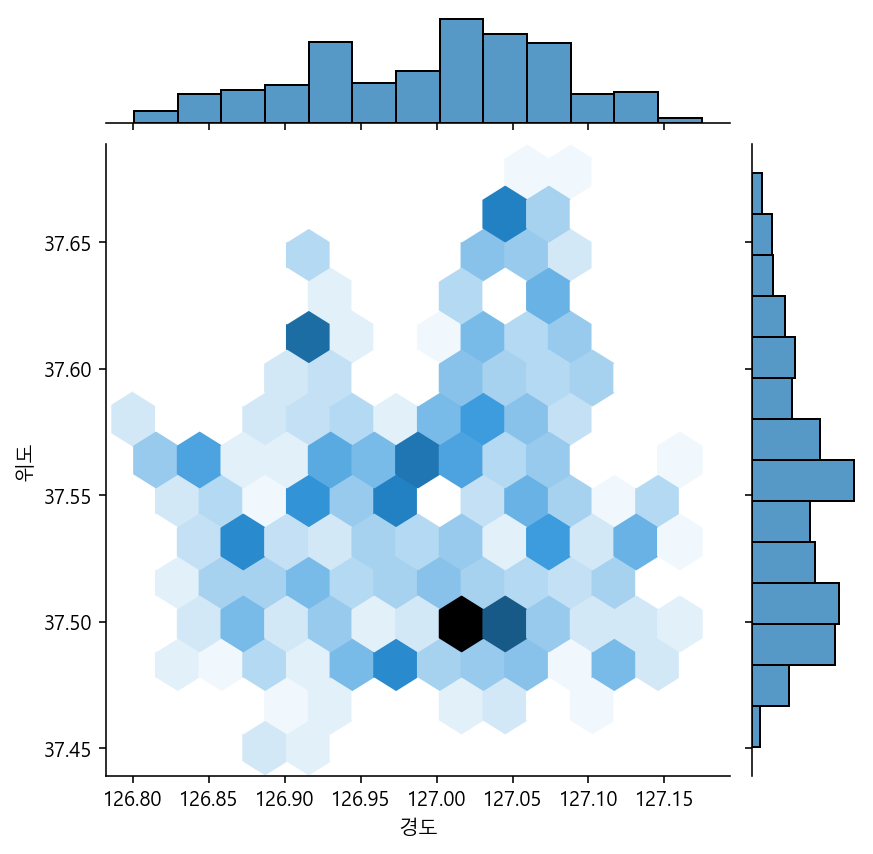

In [139]:
# jointplot : scatter plot과 히스토그램을 같이 그려줌. 안쪽은 점 데이터로 분포를 확인하고 바깥쪽은 막대그래프로 밀집도를 확인한다.
# 위에서 그렸던 그래프를 jointplot 으로 kind="hex" 을 사용해 그려봅니다. (kind의 기본값은 scatter)
sns.jointplot(data = df_31, x = "경도", y = "위도", kind = "hex")

## Folium 으로 지도 활용하기
* 다음의 프롬프트 창을 열어 conda 명령어로 설치합니다.
<img src="https://i.imgur.com/x7pzfCP.jpg">
* <font color="red">주피터 노트북 상에서 설치가 되지 않으니</font> anaconda prompt 를 열어서 설치해 주세요.


* 윈도우
    * <font color="red">관리자 권한</font>으로 아나콘다를 설치하셨다면 다음의 방법으로 anaconda prompt 를 열어 주세요.
    <img src="https://i.imgur.com/GhoLwsd.png">
* 맥
    * terminal 프로그램을 열어 설치해 주세요. 


* 다음의 문서를 활용해서 지도를 표현합니다.
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Quickstart.ipynb
* Folium 사용예제 :
http://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/

In [140]:
# 아나콘다에서 folium 을 사용하기 위해서는 별도의 설치가 필요
# https://anaconda.org/conda-forge/folium
# conda install -c conda-forge folium 
# 지도 시각화를 위한 라이브러리
import folium

In [141]:
# 지도의 중심을 지정하기 위해 위도와 경도의 평균을 구합니다. 
lat = df_31["위도"].mean()
long = df_31["경도"].mean()

In [155]:
# 샘플을 하나 추출해서 지도에 표시해 봅니다.
# folium 사용법을 보고 일부 데이터를 출력해 봅니다. sample은 랜덤하게 추출해주는데, random_state를 지정하면 일정한 값만 뽑힌다.
df_31.sample(random_state = 31)
m = folium.Map(location = [lat, long], zoom_start = 12)
folium.Marker(location = [df_31.sample(random_state = 31)["위도"], df_31.sample(random_state = 31)["경도"]]).add_to(m)
m

In [156]:
# html 파일로 저장하기
# tooltip 의 한글이 깨져보인다면 html 파일로 저장해서 보세요.
m.save("index.html")

### 서울의 배스킨라빈스와 던킨도너츠 매장 분포
* 배스킨라빈스와 던킨도너츠 매장을 지도에 표현합니다.

In [157]:
# 데이터프레임의 인덱스만 출력합니다.
df_31.index

Int64Index([    76,   1167,   1819,   2164,   2305,   2342,   3007,  11060,
             13042,  13925,
            ...
            554896, 555145, 557464, 557822, 558006, 558894, 560984, 561929,
            561930, 569825],
           dtype='int64', length=655)

### 기본 마커로 표현하기

In [215]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경합니다. 베라 : blue, 던킨 : red
m = folium.Map(location = [lat, long], zoom_start = 12)
for i in df_31.index:
    sub_lat = df_31.loc[i, "위도"]
    sub_long = df_31.loc[i, "경도"]
    title = df_31.loc[i, "상호명"] + " - " + df_31.loc[i, "도로명주소"]
    
    if df_31.loc[i, "브랜드명"] == "던킨도너츠":
        icon_color = "red"
    else:
        icon_color = "blue"
    
    folium.Marker(location = [sub_lat, sub_long], 
                  tooltip = title, 
                  popup=f'<i>{title}</i>',
                 icon = folium.Icon(color = icon_color)).add_to(m)

m.save("index.html")
m

* 베라와 던킨이 붙어있는 곳이 많음을 확인할 수 있다.
* 데이터가 너무 많아서 한눈에 보기 어려우므로 이때 MarkerCluster를 해준다.

### MarkerCluster 로 표현하기
겹쳐진 것은 숫자로 표현해줌
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb

In [160]:
from folium.plugins import MarkerCluster  # 새롭게 추가된 것
m = folium.Map(location = [lat, long], zoom_start = 12)

marker_cluster = MarkerCluster().add_to(m) # 새롭게 추가된 것

for i in df_31.index:
    sub_lat = df_31.loc[i, "위도"]
    sub_long = df_31.loc[i, "경도"]
    title = df_31.loc[i, "상호명"] + " - " + df_31.loc[i, "도로명주소"]
    
    if df_31.loc[i, "브랜드명"] == "던킨도너츠":
        icon_color = "red"
    else:
        icon_color = "blue"
    
    folium.Marker(location = [sub_lat, sub_long], 
                  tooltip = title, 
                  popup=f'<i>{title}</i>',
                  icon = folium.Icon(color = icon_color)).add_to(marker_cluster) # m에 추가하는 것이 아닌 marker_cluster에 추가한다.

m.save("index.html")
m

강남구에 베라와 던킨이 가장 많음을 알 수 있다.

## 파리바게뜨와 뚜레주르 분석하기

### 데이터 색인으로 가져오기

In [31]:
# str.contains 를 사용해서 뚜레(주|쥬)르|파리(바게|크라상) 으로 상호명을 찾습니다. 정규표현식에서 |는 or을 의미
# df_bread 라는 데이터프레임에 담습니다.
df_bread = df_seoul[df_seoul["상호명"].str.contains("뚜레(주|쥬)르|파리(바게|크라상)")].copy()
df_bread.shape

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


(825, 12)

### 가져온 데이터가 맞는지 확인하기

In [37]:
# 잘못 가져온 데이터가 있는지 확인합니다.
df_bread["상권업종대분류명"].value_counts()

음식    812
Name: 상권업종대분류명, dtype: int64

In [38]:
# 제과점과 상관 없을 것 같은 상점을 추출합니다.
df_bread[df_bread["상권업종대분류명"] == "학문/교육"]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자


In [39]:
# "상권업종대분류명"이 "학문/교육"이 아닌 것만 가져옵니다.
df_bread = df_bread[df_bread["상권업종대분류명"] != "학문/교육"].copy()
df_bread.shape

(812, 12)

In [40]:
# 상호명의 unique 값을 봅니다.
df_bread["상호명"].unique()

array(['뚜레쥬르', '파리바게뜨길동사거리점', '파리바게뜨상계제일점', '뚜레쥬르중계브라운', '파리바게뜨-판매옥수점',
       '파리바게뜨당고개점', '파리바게뜨목동오거리점', '뚜레쥬르신당역점', '파리바게뜨', '파리바게뜨서강신수점',
       '파리크라상', '파리바게뜨수유중앙점', '파리바게뜨가락중앙점', '파리바게뜨종로구기',
       '뚜레쥬르왕십리민자역사점왕십리민자역사점', '파리크라상교대역점', '뚜레쥬르도선사거리점', '여의도2호파리크라상',
       '목동파리크라상', '뚜레쥬르개봉역점', '파리바게뜨외대점', 'CJ뚜레쥬르', '신목파리바게뜨',
       '방주산업뚜레쥬르광화문경희궁의', '강동경희파리바게뜨', '파리크라상이대점', '뚜레쥬르송천센트레빌점', '파리바게트',
       '상계뚜레쥬르', '뚜레쥬르대림3동점', '뚜레쥬르목4동점', '카페약수파리바게트', '파리바게뜨가좌역점',
       '파리바게뜨영등포구청점', '뚜레쥬르독산지식센터점', '파리바게뜨수락리버시티', '파리바게뜨방학중앙점',
       '파리바게뜨중계2호점', '뚜레쥬르방화역점', '파리바게뜨중앙대점', '뚜레쥬르레이크펠리스점', '파리바게뜨장안현대점',
       '뚜레쥬르우이점', '파리바게뜨성북점', '뚜레쥬르양천푸른점', '파리바게뜨마장대로점', '파리바게뜨문정역점',
       '뚜레쥬르엔시티보라매', '파리바게뜨종로시그니처점', '파리바게뜨상계보람점', '파리바게뜨성동세무서점',
       '파리바게뜨여의경도점', '파리바게뜨구로제일점', '뚜레쥬르창동SM마트', '파리바게뜨카페대학로점',
       '파리바게뜨대림역점', '파리바게뜨월계미성', '파리크라상서래점', '파리바게뜨금천한양점', '씨제이푸드빌뚜레주르',
       '파리바게뜨휘경점', '씨제이푸드빌뚜레쥬르대학', '파리크라상키친올림픽공원점', '파리바게뜨역',
       '파리크라상강남리나스', '파리바게트은평뉴타운', '뚜레쥬르빨라쪼CU가산

In [41]:
# 상호명이 '파스쿠찌|잠바주스'가 아닌 것만 가져오세요.
df_bread = df_bread[~df_bread["상호명"].str.contains("파스쿠찌|잠바주스")].copy()
df_bread.shape

(812, 12)

In [42]:
# 브랜드명 컬럼을 만듭니다. "파리바게뜨" 에 해당되는 데이터에 대한 값을 채워줍니다.
df_bread.loc[df_bread["상호명"].str.contains("파리(바게|크라상)"),"브랜드명"] = "파리바게뜨"
df_bread[["상호명", "브랜드명"]]

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,상호명,브랜드명
2935,뚜레쥬르,NaN
13843,뚜레쥬르,NaN
14031,파리바게뜨길동사거리점,파리바게뜨
14229,파리바게뜨상계제일점,파리바게뜨
14246,뚜레쥬르중계브라운,NaN
...,...,...
559820,파리바게뜨,파리바게뜨
561538,파리바게뜨,파리바게뜨
561810,파리바게뜨,파리바게뜨
569327,파리바게뜨,파리바게뜨


In [43]:
# 브랜드명 컬럼의 결측치는 "뚜레쥬르" 이기 때문에 fillna 를 사용해서 값을 채웁니다.
df_bread["브랜드명"] = df_bread["브랜드명"].fillna("뚜레쥬르")
df_bread[["상호명", "브랜드명"]]

,상호명,브랜드명
2935,뚜레쥬르,뚜레쥬르
13843,뚜레쥬르,뚜레쥬르
14031,파리바게뜨길동사거리점,파리바게뜨
14229,파리바게뜨상계제일점,파리바게뜨
14246,뚜레쥬르중계브라운,뚜레쥬르
...,...,...
559820,파리바게뜨,파리바게뜨
561538,파리바게뜨,파리바게뜨
561810,파리바게뜨,파리바게뜨
569327,파리바게뜨,파리바게뜨


In [44]:
df_bread["브랜드명"].isnull().value_counts()

False    812
Name: 브랜드명, dtype: int64

### 범주형 변수 빈도수 계산하기

In [45]:
# 브랜드명의 빈도수를 봅니다.
bread_counts = df_bread["브랜드명"].value_counts()
bread_counts

파리바게뜨    555
뚜레쥬르     257
Name: 브랜드명, dtype: int64

In [46]:
df_bread["브랜드명"].value_counts(normalize = True)

파리바게뜨    0.683498
뚜레쥬르     0.316502
Name: 브랜드명, dtype: float64

<AxesSubplot:xlabel='브랜드명', ylabel='count'>

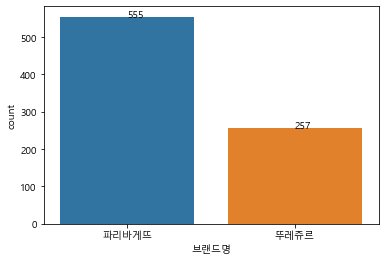

In [48]:
# countplot 으로 브랜드명을 그리고 숫자도 표시해줍시다.
g = sns.countplot(data = df_bread, x = "브랜드명", order=bread_counts.index)

for i, val in enumerate(bread_counts.index):
    g.text(x = i, y = bread_counts[i], s = bread_counts[i])
    
g

* 파바가 뚜쥬보다 훨씬 많다.

In [49]:
# 시군구별로 브랜드명의 빈도수 차이를 비교합니다. 위에 숫자도 표시해줍니다.
# 숫자를 표시해주기 위해 피봇테이블을 만듭니다.
bread_pivot = df_bread.pivot_table(index = "시군구명", columns = "브랜드명", values = "상호명", aggfunc = 'count')
bread_pivot.sort_values(by = "뚜레쥬르", ascending = False)

브랜드명,뚜레쥬르,파리바게뜨
시군구명,,
강서구,20,23
강남구,18,71
광진구,17,22
은평구,15,21
송파구,15,28
성북구,15,24
강동구,14,21
마포구,13,17
노원구,12,30


<AxesSubplot:xlabel='시군구명', ylabel='count'>

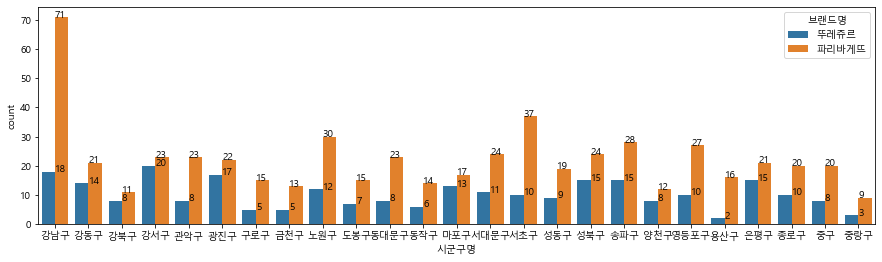

In [50]:
plt.figure(figsize = (15, 4))
c = sns.countplot(data = df_bread, x = "시군구명", hue = "브랜드명", order = bread_pivot.index)

index_num = 0
for i, val in bread_pivot.iterrows():
    ddu = val["뚜레쥬르"]
    paris = val["파리바게뜨"]
    c.text(x = index_num, y = ddu, s = ddu)
    c.text(x = index_num, y = paris, s = paris)
    index_num += 1
c    

* 뚜쥬는 강서구, 파바는 강남구에 가장 많다

<AxesSubplot:xlabel='경도', ylabel='위도'>

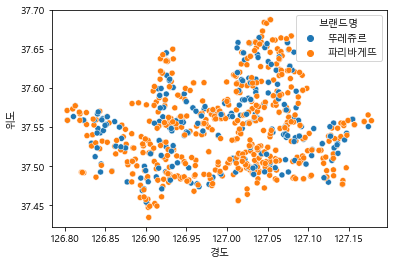

In [51]:
# scatterplot 으로 위경도를 표현해 봅니다.
sns.scatterplot(data = df_bread, x = "경도", y = "위도", hue = "브랜드명")

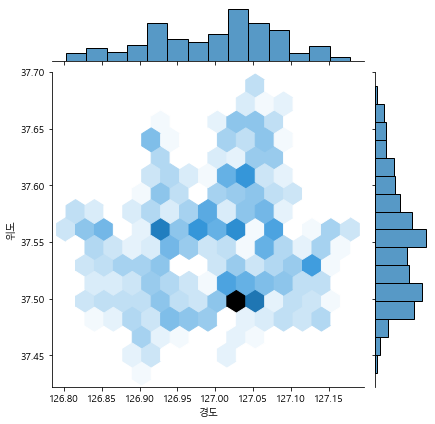

In [52]:
# jointplot 으로 위경도를 표현해 봅니다.
sns.jointplot(data = df_bread, x = "경도",  y = "위도", kind = "hex")

* 강남구와 서초구에 파바와 뚜쥬가 밀집되어 있다.

## 지도에 표현하기
### Marker 로 위치를 찍어보기

In [57]:
import folium
lat = df_bread["위도"].mean()
long = df_bread["경도"].mean()

In [58]:
m = folium.Map([lat, long], zoom_start = 12, tiles = "stamen toner")

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]    
    sub_long = df_bread.loc[i, "경도"]
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"
    else:
        icon_color = "blue"
       
    folium.CircleMarker([sub_lat, sub_long], 
                  radius = 3,      
                  tooltip=title, 
                  popup=f'<i>{title}</i>',
                  color = icon_color).add_to(m)
m.save("bread.html")
m

In [238]:
# for i in df_bread.index:
#     print(i)

In [ ]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경합니다.


### MarkerCluster 로 표현하기
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb

In [216]:
from folium.plugins import MarkerCluster  # 새롭게 추가된 것
m = folium.Map([lat, long], zoom_start = 12, tiles = "stamen toner")

marker_cluster = MarkerCluster().add_to(m) # 새롭게 추가된 것

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]    
    sub_long = df_bread.loc[i, "경도"]
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"
    else:
        icon_color = "blue"
       
    folium.CircleMarker([sub_lat, sub_long], 
                  radius = 3,      
                  tooltip=title, 
                  popup=f'<i>{title}</i>',
                  color = icon_color).add_to(marker_cluster)
m.save("bread_cluster.html")
m

### Heatmap 으로 그리기
https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Heatmap.ipynb
* array 기초 이해하기 : https://doorbw.tistory.com/171

In [64]:
# heatmap 예제 이해하기
data = (
    np.random.normal(size=(100, 3)) *
    np.array([[1, 1, 1]]) +
    np.array([[48, 5, 1]])
).tolist()
data[:5]

[[47.85909119404082, 3.5277879587294496, 0.18401153163699435],
 [49.9770510327902, 6.09501632486275, 0.6378784546014473],
 [48.323172654915865, 5.074591509648281, -0.2964360143751279],
 [47.74470026256325, 4.501281379744963, 2.7926900423572922],
 [46.9237709767319, 2.541512652466953, 2.6720919470674453]]

In [72]:
# heatmap 예제와 같은 형태로 데이터 2차원 배열 만들기
# 브랜드명을 수치형으로 바꿔줘야 한다.
# 여기서는 파리바게뜨, 뚜레쥬르는 가중치를 안줘도 되지만 만일 가중치를 줘야할 경우 숫자를 다르게 지정해준다.
heat = df_bread[["위도", "경도", "브랜드명"]]
heat["브랜드명"] = heat["브랜드명"].str.strip() # 공백 제거
heat["브랜드명"] = heat["브랜드명"].replace("파리바게뜨", 1).replace("뚜레쥬르", 1).copy()
heat


<ipython-input-72-cf7b73e861cf>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  heat["브랜드명"] = heat["브랜드명"].str.strip() # 공백 제거
<ipython-input-72-cf7b73e861cf>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  heat["브랜드명"] = heat["브랜드명"].replace("파리바게뜨", 1).replace("뚜레쥬르", 1).copy()


,위도,경도,브랜드명
2935,37.628289,127.077295,1
13843,37.498098,127.025904,1
14031,37.534154,127.136501,1
14229,37.661367,127.059227,1
14246,37.639918,127.064245,1
...,...,...,...
559820,37.477113,127.142223,1
561538,37.569257,126.818015,1
561810,37.480955,126.950620,1
569327,37.581110,126.890966,1


In [73]:
# HeatMap 그리기 그 위에 Circle Marker도 표시해주기
from folium.plugins import HeatMap # 새로 추가된 것

m = folium.Map([lat, long], zoom_start=12)
    
HeatMap(heat).add_to(m) # 새로 추가된 것


for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]
    sub_long = df_bread.loc[i, "경도"]
    
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"

    folium.CircleMarker(
        [sub_lat,sub_long ], 
        radius=3,
        color=icon_color,
        popup=f'<i>{title}</i>', 
        tooltip=title).add_to(m)

m.save('Heatmap.html')

m

In [242]:
# HeatMap 그리기 그 위에 Circle Marker도 표시해주기, Cluster도 해보기

from folium.plugins import HeatMap # 새로 추가된 것

m = folium.Map([lat, long], zoom_start=12)
    
HeatMap(heat).add_to(m) # 새로 추가된 것
marker_cluster = MarkerCluster().add_to(m)

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]    
    sub_long = df_bread.loc[i, "경도"]
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"
    else:
        icon_color = "blue"
       
    folium.CircleMarker([sub_lat, sub_long], 
                  radius = 3,      
                  tooltip=title, 
                  popup=f'<i>{title}</i>',
                  color = icon_color).add_to(marker_cluster)


m